# 04. PyTorch Custom Datasets Video Notebook

We've used some datasets with PyTorch before.

But how do you get your own data into PyTorch?

One of the ways to do so is via: custom datasets.

## Domain libraries

Depending on what you're working on, vision, text, audio, recommendation, you'll want to look into each of the PyTorch domain libraries for existing data loading functions and customizable data loading functions.

**Resources:**
* Book version of the course materials for 04: https://www.learnpytorch.io/04_pytorch_custom_datasets/
* Ground truth version of notebook 04: https://github.com/mrdbourke/pytorch-deep-learning/blob/main/04_pytorch_custom_datasets.ipynb 

## 0. Importing PyTorch and setting up device-agnostic code

In [14]:
import torch 
from torch import nn

# Note: PyTorch 1.10.0+ is required for this course
torch.__version__

'2.0.1+cu118'

In [15]:
# Setup device-agnostic code
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [16]:
!nvidia-smi

Fri Aug 18 22:54:55 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 536.67                 Driver Version: 536.67       CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 4090      WDDM  | 00000000:01:00.0  On |                  Off |
|  0%   39C    P8              19W / 450W |   3025MiB / 24564MiB |      5%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## 1. Get data 

Our dataset is a subset of the Food101 dataset.

Food101 starts 101 different classes of food and 1000 images per class (750 training, 250 testing).

Our dataset starts with 3 classes of food and only 10% of the images (~75 training, 25 testing).

Why do this?

When starting out ML projects, it's important to try things on a small scale and then increase the scale when necessary.

The whole point is to speed up how fast you can experiment.

In [17]:
import requests
import zipfile
from pathlib import Path

url = "https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip"
filename = url.split('/')[-1]

# Setup path to a data folder
data_path = Path("data/")
image_path = data_path / "pizza_steak_sushi"

# If the image folder doesn't exists, download it and prepare it...
if image_path.is_dir():
  print(f"{image_path} directory already exists... skipping download")
else:
  print(f"{image_path} does not exists, creating one...")
  image_path.mkdir(parents=True, exist_ok=True)

  # Download pizza, steak and sushi data
  with open(data_path / filename, "wb") as f:
    request = requests.get(url=url)
    print("Downloading pizza, steak, sushi data...")
    f.write(request.content)

# Unzip pizza, steak, sushi data
with zipfile.ZipFile(data_path / filename, "r") as zip_ref:
  print("Unzipping pizza, steak, and sushi data...")
  zip_ref.extractall(image_path)

data\pizza_steak_sushi directory already exists... skipping download
Unzipping pizza, steak, and sushi data...


## 2. Becoming one with the data (data preparation and data exploration)

In [18]:
import os

def walk_through_dir(dir_path):
  """
  Walks through dir_path returning its contents.
  """
  for dirpath, dirname, filenames in os.walk(dir_path):
    print(f"There are {len(dirname)} directories {len(filenames)} images in '{dirpath}'.")

In [19]:
walk_through_dir(image_path)

There are 2 directories 0 images in 'data\pizza_steak_sushi'.
There are 3 directories 0 images in 'data\pizza_steak_sushi\test'.
There are 0 directories 25 images in 'data\pizza_steak_sushi\test\pizza'.
There are 0 directories 19 images in 'data\pizza_steak_sushi\test\steak'.
There are 0 directories 31 images in 'data\pizza_steak_sushi\test\sushi'.
There are 3 directories 0 images in 'data\pizza_steak_sushi\train'.
There are 0 directories 78 images in 'data\pizza_steak_sushi\train\pizza'.
There are 0 directories 75 images in 'data\pizza_steak_sushi\train\steak'.
There are 0 directories 72 images in 'data\pizza_steak_sushi\train\sushi'.


In [20]:
# Setup train and testing paths
train_dir = image_path / "train"
test_dir  = image_path / "test"

train_dir, test_dir

(WindowsPath('data/pizza_steak_sushi/train'),
 WindowsPath('data/pizza_steak_sushi/test'))

### 2.1 Visualizing and image

Let's write some code to:
1. Get all of the image path
2. Pick a random image path using Python's random.choice()
3. Get the image class name using `pathlib.Path.parent.stem`
4. Since we're working with images, let's open the image with Python's PIL
5. We'll then show the image and print metadata

data\pizza_steak_sushi\train\steak\421476.jpg
steak
Random image path: data\pizza_steak_sushi\train\steak\421476.jpg
Image class: steak
Image height: 512
Image width: 512


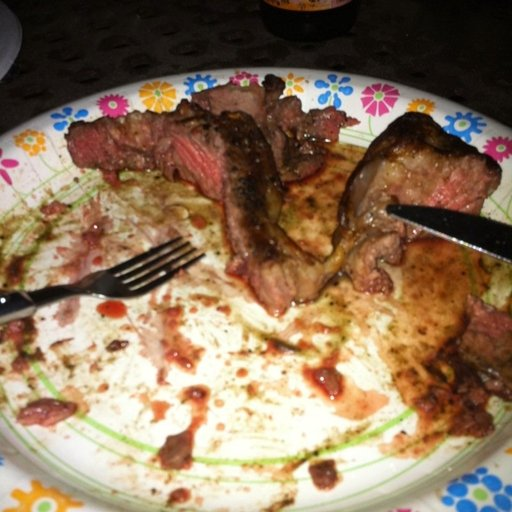

In [58]:
import random
from PIL import Image

# Set seed
# random.seed(42)

# 1. Get all image paths
image_path_list = list(image_path.glob("*/*/*.jpg"))

# 2. Pick a random image path
random_image_path = random.choice(image_path_list)

print(random_image_path)

# 3. Get image class from path name (the image class is the name of the directory where the image is stored)
image_class = random_image_path.parent.name
print(image_class)

# 4. Open image
img = Image.open(random_image_path)

# 5. Print metadata
print(f"Random image path: {random_image_path}")
print(f"Image class: {image_class}")
print(f"Image height: {img.height}")
print(f"Image width: {img.width}")
img

In [61]:
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

# Turn the image into an array
img_as_array = np.asarray(img)

# Plot the image with plotly
figure = go.Figure(layout_title=f"Image class: {image_class} | Image shape: {img_as_array.shape} -> [height, width, color channels]")
figure.add_image(z=img_as_array)


In [62]:
img_as_array

array([[[ 16,  15,  13],
        [ 11,  10,   8],
        [  5,   4,   2],
        ...,
        [  6,   4,   5],
        [  6,   4,   5],
        [  5,   3,   4]],

       [[ 22,  21,  19],
        [ 18,  17,  15],
        [ 13,  12,  10],
        ...,
        [  6,   4,   5],
        [  6,   4,   5],
        [  5,   3,   4]],

       [[ 26,  25,  23],
        [ 25,  24,  22],
        [ 20,  19,  17],
        ...,
        [  6,   4,   5],
        [  5,   3,   4],
        [  4,   2,   3]],

       ...,

       [[208, 196, 184],
        [209, 193, 177],
        [210, 188, 165],
        ...,
        [ 57, 104, 156],
        [ 75, 119, 168],
        [ 91, 135, 182]],

       [[210, 195, 166],
        [208, 189, 157],
        [205, 180, 139],
        ...,
        [ 71, 113, 163],
        [ 90, 128, 175],
        [106, 144, 189]],

       [[210, 194, 158],
        [206, 187, 145],
        [201, 173, 125],
        ...,
        [ 83, 121, 170],
        [101, 138, 183],
        [119, 153, 198]]